## Final Project Code for Data Parsing and SVM, RF, NB classifiers

In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn as sk
import os
import sys
from IPython.display import display, Image
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelBinarizer
from sklearn import preprocessing
from sklearn.metrics import roc_curve, auc
from six.moves import cPickle as pickle
from six.moves import range
from sklearn.preprocessing import OneHotEncoder
from sklearn import model_selection
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from timeit import default_timer as timer
# needed to see images
from IPython.display import display, Image

# Config the matlotlib backend as plotting inline in IPython
#%matplotlib inline

import tensorflow as tf
import time
import pickle
import LoadData
import seaborn as sns
import librosa
current_palette = sns.color_palette()

In [2]:
# import 
import tarfile
t = tarfile.open('UrbanSound8K.tar.gz', mode="r:gz")
t.extractall()

In [3]:
raw_sound = pd.read_csv('UrbanSound8K/metadata/UrbanSound8K.csv')
raw_sound.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [36]:
import soundfile as sf
data, samplerate = sf.read('UrbanSound8K/audio/fold1/102106-3-0-0.wav')
print(data, samplerate)

[[-0.01174927  0.03039551]
 [-0.01153564  0.02471924]
 [-0.01644897  0.01794434]
 ..., 
 [-0.00588989  0.00012207]
 [ 0.00314331  0.00585938]
 [ 0.00540161  0.00689697]] 44100


In [37]:
fold_list = []
for i in range(1,11):
    fold_name = 'fold' + str(i)
    fold_list.append(fold_name)
print(fold_list)

['fold1', 'fold2', 'fold3', 'fold4', 'fold5', 'fold6', 'fold7', 'fold8', 'fold9', 'fold10']


In [38]:
from python_speech_features import mfcc
from python_speech_features import logfbank
import scipy.io.wavfile as wave
from scipy.fftpack import dct 

In [39]:
def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

In [40]:
a,b,c,d,e = extract_feature('UrbanSound8K/audio/fold1/102106-3-0-0.wav')

/Users/ted/anaconda2/envs/tensorflow1/lib/python3.5/site-packages/numpy/core/numeric.py:482: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return array(a, dtype, copy=False, order=order)


In [41]:
print(a.shape,b.shape,c.shape,d.shape,e.shape)
print(a[0])
print(40+12+128+13)

(40,) (12,) (128,) (7,) (6,)
-253.201139054
193


In [ ]:
from os import listdir
from os.path import isfile, join
mfcc_data = []
exception_count = 0

for i in range(10):
    mypath = 'UrbanSound8K/audio/'+ fold_list[i] + '/'
    files = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    for f in files:
        try:
            fn = mypath + f
            mfccs,chroma,mel,contrast,tonnetz = extract_feature(fn)
            features = np.empty((0,193))
            ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
            features = np.vstack([features,ext_features])
            
        except:
            print(f)
            exception_count += 1
            continue

        l_row = raw_sound.loc[raw_sound['slice_file_name']==f].values.tolist()
        label = l_row[0][-1]
        class_id = l_row[0][-2]
        fold = i+1
    
        mfcc_data.append([features, features.shape, class_id, label, fold])
        
            #print(f,old_samplerate,ss)
        
print("Exceptions: ", exception_count)

In [42]:
mfcc_pd = pickle.load(open('feature_data1.p',"rb"))

In [43]:
cols=["features", "shape","label_id", "label", "fold"]
mfcc_pd = pd.DataFrame(data = mfcc_pd, columns=cols)

In [44]:
mfcc_pd.head()

,features,shape,label_id,label,fold
0,"[[-402.458131222, 92.2208198393, 19.3559458953...","(1, 193)",3,dog_bark,1
1,"[[-366.481581922, 126.422493153, 31.1635153803...","(1, 193)",3,dog_bark,1
2,"[[-421.545181629, 69.0278123077, 11.2546785074...","(1, 193)",3,dog_bark,1
3,"[[-253.201139054, 99.422307006, -42.0187279331...","(1, 193)",3,dog_bark,1
4,"[[-383.810140281, 128.451555696, 29.3132434931...","(1, 193)",6,gun_shot,1


In [45]:
labels = set(mfcc_pd['label'])
print(labels)
cnt = [[label,list(mfcc_pd['label']).count(label)] for label in labels]
dict_cnt = dict(cnt)
dict_cnt

{'siren', 'gun_shot', 'car_horn', 'jackhammer', 'dog_bark', 'street_music', 'engine_idling', 'drilling', 'children_playing', 'air_conditioner'}


{'air_conditioner': 1000,
 'car_horn': 429,
 'children_playing': 1000,
 'dog_bark': 1000,
 'drilling': 1000,
 'engine_idling': 1000,
 'gun_shot': 374,
 'jackhammer': 1000,
 'siren': 929,
 'street_music': 1000}

In [46]:
cnt_cols=["classes","occurence"]
count_pd = pd.DataFrame(data = cnt, columns=cnt_cols)

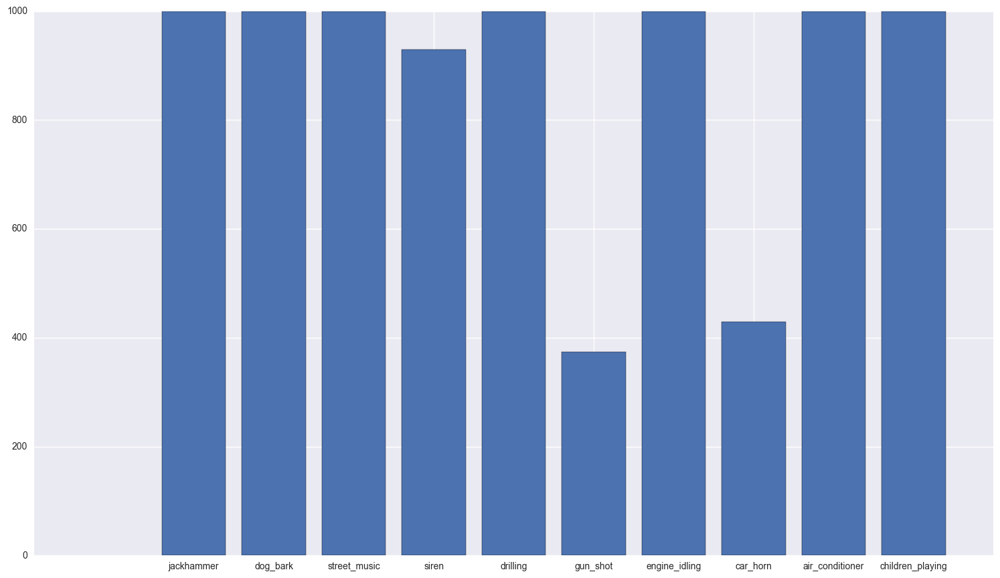

In [47]:
#dictionary = plt.figure()
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
fig.savefig('test2png.png', dpi=100)

fig.set_size_inches(18.5, 10.5, forward=True)
plt.bar(range(len(dict_cnt)), dict_cnt.values(), align='center')
plt.xticks(range(len(dict_cnt)), dict_cnt.keys())
plt.show()
#plot_url = py.plot_mpl(dictionary, filename='mpl-dictionary')


In [48]:
labels = set(mfcc_pd['label_id'])
mapping = []
for label_id in labels:
    
    label_name = set(mfcc_pd.loc[mfcc_pd['label_id'] == label_id]['label'])
    mapping.append((label_id,label_name))
label_mapping = dict(mapping)
label_mapping

{0: {'air_conditioner'},
 1: {'car_horn'},
 2: {'children_playing'},
 3: {'dog_bark'},
 4: {'drilling'},
 5: {'engine_idling'},
 6: {'gun_shot'},
 7: {'jackhammer'},
 8: {'siren'},
 9: {'street_music'}}

In [49]:
ll = [mfcc_pd['features'][i].ravel() for i in range(mfcc_pd.shape[0])]
mfcc_pd['sample'] = pd.Series(ll, index=mfcc_pd.index)
del mfcc_pd['features']

In [11]:
#http://www.practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/
#http://haythamfayek.com/2016/04/21/speech-processing-for-machine-learning.html

In [50]:
# Random Forest classifier. Use fold10 as test set. Use fold1-9 for 9-fold cross validation
forest = OneVsRestClassifier(RandomForestClassifier(n_estimators = 500, max_depth=20, min_samples_leaf=30))

In [51]:
train_data = np.array(list(mfcc_pd.loc[mfcc_pd['fold'] < 9]['sample']))
train_label = np.array(mfcc_pd.loc[mfcc_pd['fold'] < 9]['label_id'])
validation_data = np.array(list(mfcc_pd.loc[mfcc_pd['fold'] == 9]['sample']))
validation_label = np.array(mfcc_pd.loc[mfcc_pd['fold'] == 9]['label_id'])
#test_data = np.array(list(mfcc_pd.loc[mfcc_pd['fold'] == 10]['sample']))
#test_label = np.array(mfcc_pd.loc[mfcc_pd['fold'] == 10]['label_id'])

In [52]:
print(train_data.shape)
print(type(train_data))

(7079, 193)
<class 'numpy.ndarray'>


In [53]:
np.mean(train_data[0])

0.74978763652210922

In [54]:
forestmodel = forest.fit(train_data, train_label)

In [55]:
prediction = forestmodel.predict(validation_data)

In [62]:
prob_pred = forestmodel.predict_proba(validation_data)

In [67]:
prob_pred[0]

array([ 0.11647523,  0.00866536,  0.04644898,  0.03081829,  0.39175508,
        0.07134991,  0.04563356,  0.23805537,  0.0273662 ,  0.02343201])

In [56]:
np.sum(prediction == validation_label)/validation_label.shape[0]

0.61519607843137258

In [100]:
def confusion(true, predicted):
    matrix = np.zeros([10,10])
    #d = 0
    for t, p in zip(true, predicted):
        matrix[t,p] += 1.5
    #    d += 1
    #print(d)
    return matrix

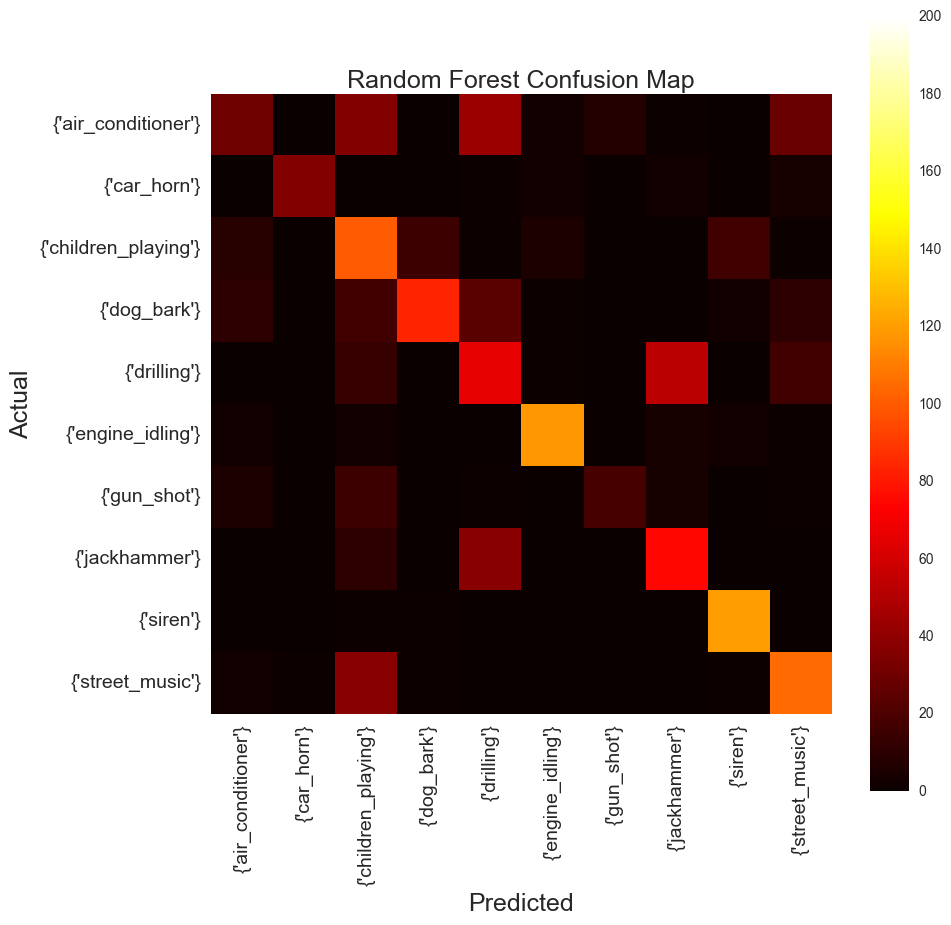

In [103]:
classe_names = label_mapping.values()
matrix = confusion(validation_label, prediction)

plt.figure(figsize=[10,10])
plt.imshow(matrix, cmap='hot', interpolation='nearest',  vmin=0, vmax=200)
plt.colorbar()
plt.title('Random Forest Confusion Map', fontsize=18)
plt.ylabel('Actual', fontsize=18)
plt.xlabel('Predicted', fontsize=18)
plt.grid(b=False)
plt.yticks(range(10), classe_names, fontsize=14)
plt.xticks(range(10), classe_names, fontsize=14, rotation='vertical')
plt.show()

In [95]:
from sklearn.svm import NuSVC
from sklearn.svm import SVC

In [96]:
svm = OneVsRestClassifier(NuSVC(nu=.08, kernel='poly', decision_function_shape='ovr'))
svmmodel = svm.fit(train_data, train_label)

In [97]:
svc_prediction = svmmodel.predict(validation_data)

In [98]:
svc_accuracy = np.sum(svc_prediction == validation_label)/validation_label.shape[0]
svc_accuracy

0.59926470588235292

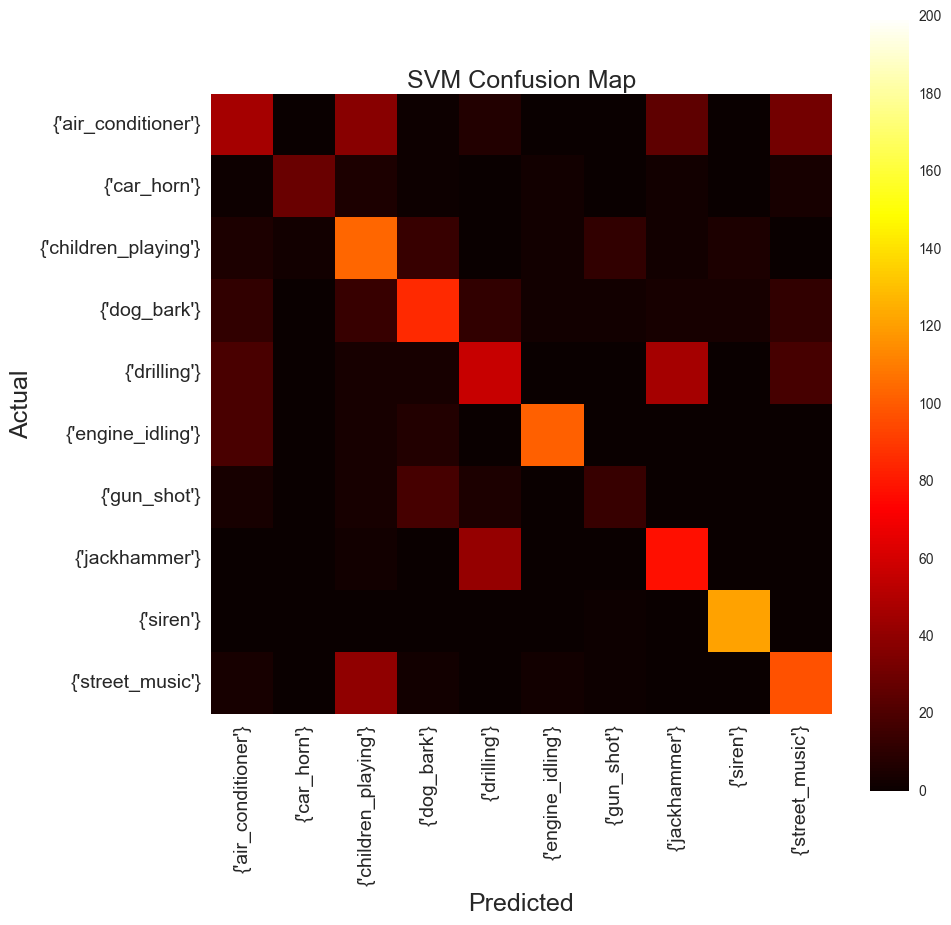

In [102]:
classe_names = label_mapping.values()
matrix = confusion(validation_label, svc_prediction)

plt.figure(figsize=[10,10])
plt.imshow(matrix, cmap='hot', interpolation='nearest',  vmin=0, vmax=200)
plt.colorbar()
plt.title('SVM Confusion Map', fontsize=18)
plt.ylabel('Actual', fontsize=18)
plt.xlabel('Predicted', fontsize=18)
plt.grid(b=False)
plt.yticks(range(10), classe_names, fontsize=14)
plt.xticks(range(10), classe_names, fontsize=14, rotation='vertical')
plt.show()

In [104]:
NB = OneVsRestClassifier(GaussianNB())
nbmodel = NB.fit(train_data, train_label)

In [105]:
NB_prediction = nbmodel.predict(validation_data)

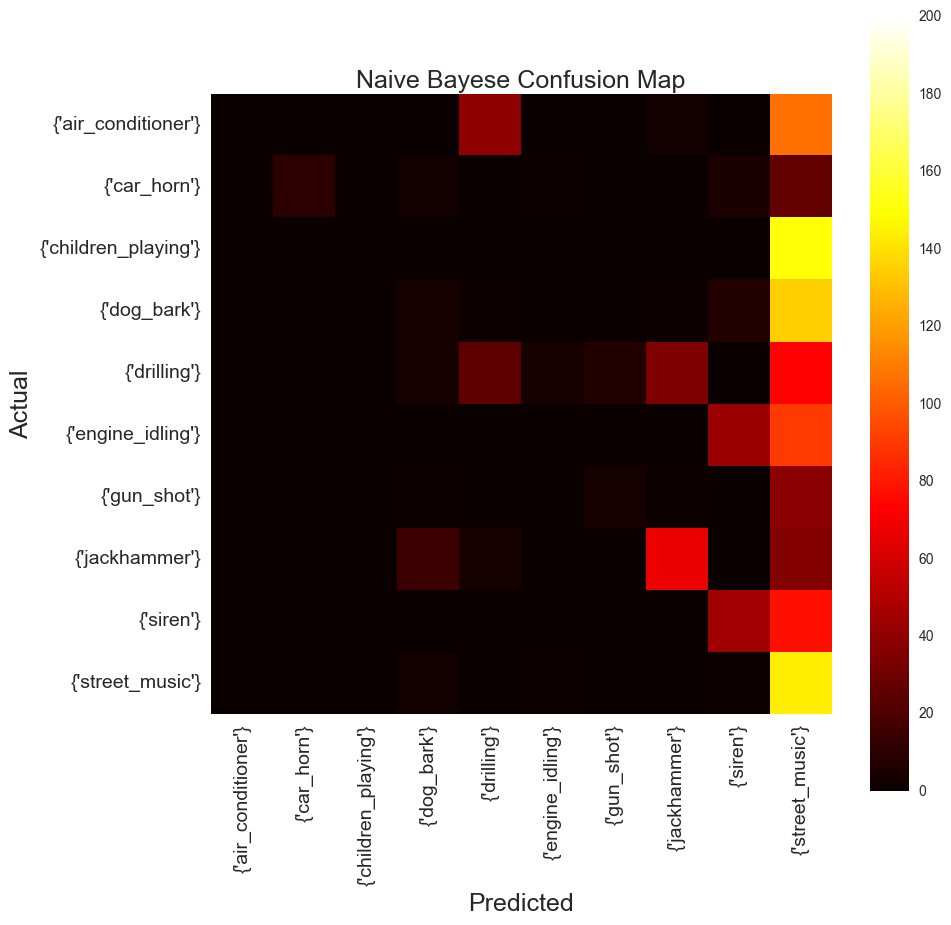

In [107]:
classe_names = label_mapping.values()
matrix = confusion(validation_label, NB_prediction)

plt.figure(figsize=[10,10])
plt.imshow(matrix, cmap='hot', interpolation='nearest',  vmin=0, vmax=200)
plt.colorbar()
plt.title('Naive Bayese Confusion Map', fontsize=18)
plt.ylabel('Actual', fontsize=18)
plt.xlabel('Predicted', fontsize=18)
plt.grid(b=False)
plt.yticks(range(10), classe_names, fontsize=14)
plt.xticks(range(10), classe_names, fontsize=14, rotation='vertical')
plt.show()

In [38]:
nb_accuracy = np.sum(NB_prediction == validation_label)/validation_label.shape[0]
nb_accuracy

0.23536439665471923

In [12]:
const_shape = pickle.load(open('const_shape.p','rb'))

In [13]:
const_shape.head()

,0,1,2,3,4,5,6,7,8,9,...,812,813,814,815,816,817,818,819,label,fold
0,-303.665214,175.674805,-0.909009,-22.381963,0.168827,-4.858560,-36.412949,-29.090563,-24.699204,-25.110877,...,13.034615,4.838418,-14.927127,-22.080391,-8.793089,3.785474,-0.751638,-9.906296,dog_bark,1
1,-347.708961,190.784639,47.382200,-43.525568,-12.407683,5.094730,-47.564077,-29.293994,-30.747255,-1.472716,...,3.514627,-2.596958,-5.264056,-7.565407,-8.784303,-2.059884,5.848355,2.300709,dog_bark,1
2,-221.618954,182.523961,14.075528,1.103653,-18.543893,-1.274622,-30.537660,-11.242536,-13.128010,-5.913963,...,-1.487615,3.141583,7.112016,5.410804,-0.278725,-2.883559,0.067862,4.165906,dog_bark,1
3,-186.991836,153.742641,-69.260622,-31.808085,-7.238316,3.339198,-3.904681,-11.158155,0.245385,9.296590,...,18.228318,21.316016,-0.333578,-12.468618,-14.992194,-14.915432,-10.066552,3.212815,dog_bark,1
4,-478.384551,163.901951,40.952569,12.116725,7.309964,-1.079614,-10.135202,8.479305,4.288644,5.266921,...,4.777347,8.632009,6.367369,7.084391,3.348874,11.240836,6.784668,12.945714,gun_shot,1


In [14]:
const_shape['label_id'] = mfcc_pd['label_id']

In [40]:
const_shape[:10]

,0,1,2,3,4,5,6,7,8,9,...,813,814,815,816,817,818,819,label,fold,label_id
0,-303.665214,175.674805,-0.909009,-22.381963,0.168827,-4.858560,-36.412949,-29.090563,-24.699204,-25.110877,...,4.838418,-14.927127,-22.080391,-8.793089,3.785474,-0.751638,-9.906296,dog_bark,1,3
1,-347.708961,190.784639,47.382200,-43.525568,-12.407683,5.094730,-47.564077,-29.293994,-30.747255,-1.472716,...,-2.596958,-5.264056,-7.565407,-8.784303,-2.059884,5.848355,2.300709,dog_bark,1,3
2,-221.618954,182.523961,14.075528,1.103653,-18.543893,-1.274622,-30.537660,-11.242536,-13.128010,-5.913963,...,3.141583,7.112016,5.410804,-0.278725,-2.883559,0.067862,4.165906,dog_bark,1,3
3,-186.991836,153.742641,-69.260622,-31.808085,-7.238316,3.339198,-3.904681,-11.158155,0.245385,9.296590,...,21.316016,-0.333578,-12.468618,-14.992194,-14.915432,-10.066552,3.212815,dog_bark,1,3
4,-478.384551,163.901951,40.952569,12.116725,7.309964,-1.079614,-10.135202,8.479305,4.288644,5.266921,...,8.632009,6.367369,7.084391,3.348874,11.240836,6.784668,12.945714,gun_shot,1,6
5,-387.770710,109.951305,49.255936,38.467465,2.528642,9.948881,0.039392,-0.743910,-13.335413,-4.134461,...,6.101377,12.266537,13.674683,2.599425,8.743840,-1.755183,6.510044,dog_bark,1,3
6,-384.207593,99.981214,14.763002,8.292791,-0.177109,15.759701,-2.766530,-8.922327,-12.455066,7.893366,...,6.810432,6.669972,12.928725,-7.550032,-6.357872,-11.969550,-4.121913,dog_bark,1,3
7,-328.896910,141.462109,12.506944,-2.171325,-3.021739,-1.802165,-18.337903,-5.792387,-10.054640,0.593087,...,12.060055,9.713478,6.872621,-8.503142,0.705280,-7.080760,-6.459029,dog_bark,1,3
8,-398.435279,81.915434,14.115991,20.962687,4.089972,6.101887,2.727284,3.856556,-12.476839,4.479104,...,15.915244,13.800272,4.789974,-8.039799,-2.572644,1.633845,5.993840,dog_bark,1,3
9,-143.505975,61.503396,-12.527725,13.261999,-26.533128,4.502676,-10.030035,4.594973,-0.239138,-3.934690,...,16.877925,0.940041,4.154018,-3.785618,-1.187882,-6.321457,7.159413,jackhammer,1,7


In [16]:
const_shape.fold = const_shape.fold.astype(np.int64)

In [17]:
type(const_shape['label_id'][0])

numpy.int64

In [41]:
const_train_data = const_shape.loc[const_shape['fold'] < 9]
del const_train_data['label']
del const_train_data['fold']
del const_train_data['label_id']
const_train_data = np.array(const_train_data)

const_validation_data = const_shape.loc[const_shape['fold'] == 9]
del const_validation_data['label']
del const_validation_data['fold']
del const_validation_data['label_id']
const_validation_data = np.array(const_validation_data)

const_train_label = np.array(const_shape.loc[const_shape['fold'] < 9]['label_id'])
const_validation_label = np.array(const_shape.loc[const_shape['fold'] == 9]['label_id'])


In [42]:
print(const_train_data.shape)
print(type(const_train_data))

(7079, 820)
<class 'numpy.ndarray'>


In [20]:
#svm_const = OneVsRestClassifier(NuSVC(nu=.08, kernel='poly', decision_function_shape='ovr',verbose = 2))
svm_const = OneVsRestClassifier(SVC(kernel='poly', decision_function_shape='ovr',verbose = 2))
svmmodel = svm_const.fit(const_train_data, const_train_label)

[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]

In [ ]:
print(svmmodel.predict(const_validation_data)[:100])

In [49]:
const_svc_prediction = svmmodel.predict(const_validation_data)
svm_accuracy = np.sum(const_svc_prediction[:816] == const_validation_label[:816])/816
#validation_label.shape[0]
svm_accuracy

0.32598039215686275

In [ ]:
svm_accuracy = np.sum(const_svc_prediction[:500] == const_validation_label[:500])
#validation_label.shape[0]
svm_accuracy

In [69]:
validation_label.shape[0]

816

In [43]:
forest = OneVsRestClassifier(RandomForestClassifier(n_estimators = 500, max_depth=20, min_samples_leaf=30))

In [44]:
const_forestmodel = forest.fit(const_train_data, const_train_label)

In [45]:
cf_prediction = const_forestmodel.predict(const_validation_data)

In [47]:
np.sum(cf_prediction[:816] == const_validation_label[:816]) /const_validation_label.shape[0]

0.45220588235294118

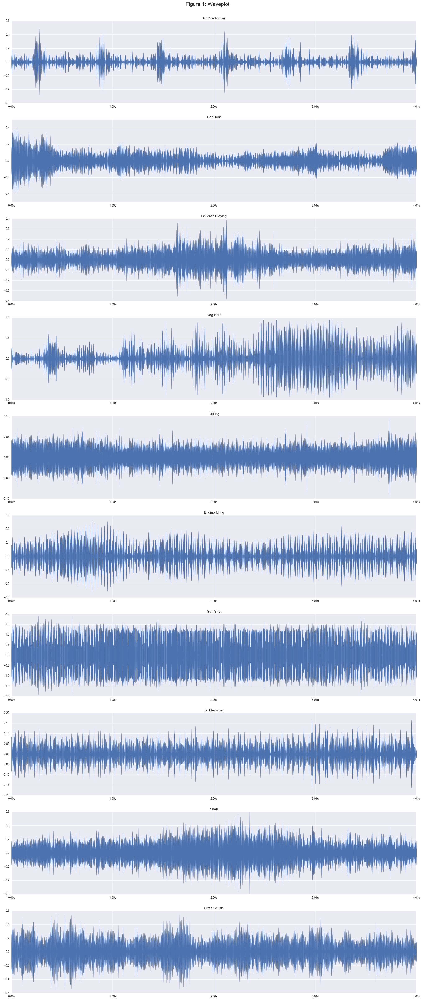

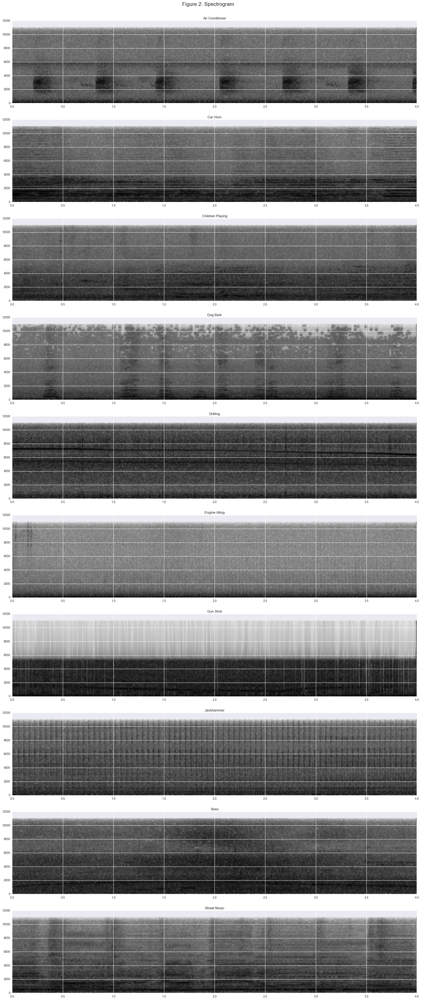

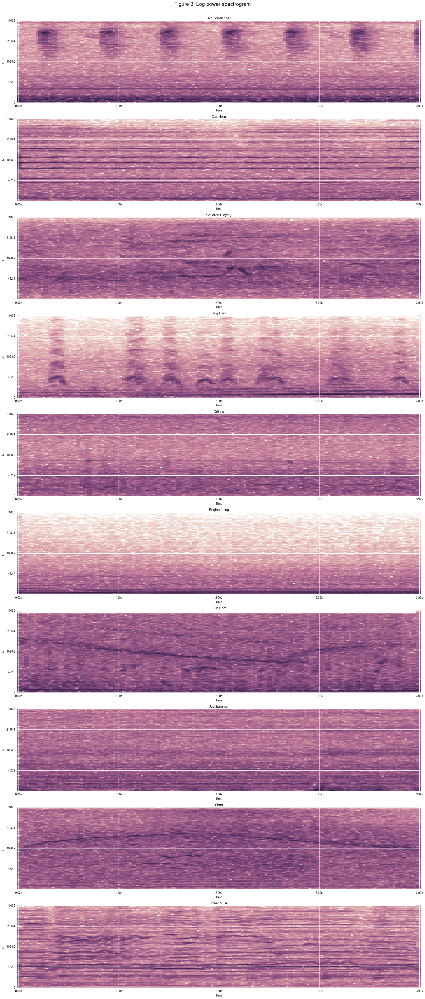

In [26]:
#Code for Visualization borrowed from : https://aqibsaeed.github.io/2016-09-03-urban-sound-classification-part-1/


from matplotlib.pyplot import specgram
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

#mypath = 'UrbanSound8K/audio/'    
    
sound_file_paths = ["UrbanSound8K/audio/fold1/57320-0-0-7.wav","UrbanSound8K/audio/fold1/24074-1-0-3.wav",\
                    "UrbanSound8K/audio/fold1/15564-2-0-1.wav","UrbanSound8K/audio/fold1/31323-3-0-1.wav",\
                    "UrbanSound8K/audio/fold1/46669-4-0-35.wav","UrbanSound8K/audio/fold1/89948-5-0-0.wav",\
                    "UrbanSound8K/audio/fold1/40722-8-0-4.wav","UrbanSound8K/audio/fold1/103074-7-3-2.wav",
                    "UrbanSound8K/audio/fold1/106905-8-0-0.wav","UrbanSound8K/audio/fold1/108041-9-0-4.wav"]


sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]

raw_sounds = load_sound_files(sound_file_paths)

plot_waves(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)
plot_log_power_specgram(sound_names,raw_sounds)